<a href="https://colab.research.google.com/github/shentan-shiina/Colab_Deployment_Log/blob/main/drifting_model_demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Drifting Models: A Step-by-Step Demo

**Paper:** Generative Modeling via Drifting

This demo walks you through the core algorithm with hands-on examples:

1. **Part 1: Core Algorithm** — The drifting loss and drift computation
2. **Part 2: Toy 2D** — Visualize dynamics on swiss roll & checkerboard

**More samples and full results can be found in the paper.**

---

# Install packages

In [ ]:
!pip install -q matplotlib numpy torch torchvision tqdm einops

In [ ]:
import os
import sys
import math
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

# Device selection
# - In Colab: prefer CUDA (GPU) and warn if GPU isn't enabled
# - Locally: prefer CUDA, then Apple Silicon MPS, then CPU
IN_COLAB = (
    "google.colab" in sys.modules
    or os.environ.get("COLAB_GPU") is not None
    or os.environ.get("COLAB_TPU_ADDR") is not None
)

if torch.cuda.is_available():
    DEVICE = torch.device("cuda")
elif (not IN_COLAB) and torch.backends.mps.is_available():
    DEVICE = torch.device("mps")
else:
    DEVICE = torch.device("cpu")

print(f"Using device: {DEVICE} (IN_COLAB={IN_COLAB})")
if IN_COLAB and DEVICE.type != "cuda":
    print(
        "[Warning] Colab is not running with GPU enabled. Please select 'Runtime -> Change runtime type -> GPU' in the menu and re-run this cell."
    )

Using device: cuda (IN_COLAB=True)


# Part 1: Core Algorithm

**Traditional generative models** (Diffusion, Flow Matching) iterate at **inference time**.

**Drifting Models** move the iteration to **training time**:
- Each training step "drifts" the generated samples according to a drifting field
- At inference: just one forward pass (1 NFE)

## Training Objective

Given a generator $f_\theta$ that maps noise $\epsilon$ to samples, the training loss is:

$$
L = \mathbb{E}_{\epsilon} \Big[ \big\| f_\theta(\epsilon) - \text{stopgrad}\big(f_\theta(\epsilon) + \mathbf{V}_{p,q}(f_\theta(\epsilon))\big) \big\|^2 \Big]
$$

We move predictions toward their **drifted** versions. The drifting field $\mathbf{V}_{p,q}$, depending on the data distribution $p$ and the generated distribution $q$, tells each generated sample where to go. This can be implemented as the following code.

In [ ]:

def drifting_loss(gen: torch.Tensor, pos: torch.Tensor, compute_drift):
    """Drifting loss: MSE(gen, stopgrad(gen + V))."""
    with torch.no_grad():
        V = compute_drift(gen, pos)
        target = (gen + V).detach()
    return F.mse_loss(gen, target)

## Mean-shift Drifting Field

Having described the general training objective, we now describe a concrete instantiation of the drifting field $\mathbf{V}_{p,q}$.

In principle, $\mathbf{V}_{p,q}$ can be a wide range of vector fields, as long as it satisfies $\mathbf{V}_{p,p} = \mathbf{0}$. In this paper, we use an instantiation inspired by **mean-shift**, defined as

$$
\mathbf{V}_{p,q}(\mathbf{x}) := \mathbf{V}_p^{+}(\mathbf{x}) - \mathbf{V}_q^{-}(\mathbf{x}),
$$

where

$$
\mathbf{V}_p^{+}(\mathbf{x}) := \frac{1}{Z_p(\mathbf{x})} \, \mathbb{E}_{\mathbf{y}^{+} \sim p} \big[ k(\mathbf{x}, \mathbf{y}^{+}) (\mathbf{y}^{+} - \mathbf{x}) \big], \quad \mathbf{V}_q^{-}(\mathbf{x}) := \frac{1}{Z_q(\mathbf{x})} \, \mathbb{E}_{\mathbf{y}^{-} \sim q} \big[ k(\mathbf{x}, \mathbf{y}^{-}) (\mathbf{y}^{-} - \mathbf{x}) \big].
$$

The normalizers are

$$
Z_p(\mathbf{x}) := \mathbb{E}_{\mathbf{y}^{+} \sim p} \big[ k(\mathbf{x}, \mathbf{y}^{+}) \big], \quad Z_q(\mathbf{x}) := \mathbb{E}_{\mathbf{y}^{-} \sim q} \big[ k(\mathbf{x}, \mathbf{y}^{-}) \big].
$$

Substituting into $\mathbf{V}_{p,q} = \mathbf{V}_p^{+} - \mathbf{V}_q^{-}$, we obtain the compact form

$$
\mathbf{V}_{p,q}(\mathbf{x}) = \frac{1}{Z_p(\mathbf{x}) Z_q(\mathbf{x})} \, \mathbb{E}_{\mathbf{y}^{+} \sim p, \, \mathbf{y}^{-} \sim q} \big[ k(\mathbf{x}, \mathbf{y}^{+}) \, k(\mathbf{x}, \mathbf{y}^{-}) \, (\mathbf{y}^{+} - \mathbf{y}^{-}) \big].
$$

---

### Implementation (batch-normalized Monte Carlo estimate)

In practice, we approximate the above expectation using mini-batches. Specifically, we use

$$
\mathbf{V}(\mathbf{x}) := \mathbb{E} \big[ K_B(\mathbf{x}, \mathbf{y}^{+}) \, K_B(\mathbf{x}, \mathbf{y}^{-}) \, (\mathbf{y}^{+} - \mathbf{y}^{-}) \big],
$$

where $K_B$ is a **batch-normalized kernel**: the kernel $k$ is normalized over samples in batch $B$.

This construction guarantees $\mathbf{V}_{p,p} = \mathbf{0}$: when $p = q$, the term $(\mathbf{y}^{+} - \mathbf{y}^{-})$ is anti-symmetric and cancels out in expectation. The resulting field can be efficiently estimated via Monte Carlo over mini-batches.

Below is a reference PyTorch-style implementation, where $k(\mathbf{x}, \mathbf{y}) = \exp(-\|\mathbf{x} - \mathbf{y}\| / \tau)$, and $K_B$ implements the normalization across both $\mathbf x$ and $\mathbf y$, since we found it to slightly improve performance.

In [ ]:
# ============================================================
# Core: Compute Drift V and Loss (from toy_mean_drift.py)
# ============================================================

def compute_drift(gen: torch.Tensor, pos: torch.Tensor, temp: float = 0.05):
    """
    Compute drift field V with attention-based kernel.

    Args:
        gen: Generated samples [G, D]
        pos: Data samples [P, D]
        temp: Temperature for softmax kernel

    Returns:
        V: Drift vectors [G, D]
    """
    targets = torch.cat([gen, pos], dim=0)
    G = gen.shape[0]

    dist = torch.cdist(gen, targets)
    dist[:, :G].fill_diagonal_(1e6)  # mask self
    kernel = (-dist / temp).exp() # unnormalized kernel

    normalizer = kernel.sum(dim=-1, keepdim=True) * kernel.sum(dim=-2, keepdim=True) # normalize along both dimensions, which we found to slightly improve performance
    normalizer = normalizer.clamp_min(1e-12).sqrt()
    normalized_kernel = kernel / normalizer

    pos_coeff = normalized_kernel[:, G:] * normalized_kernel[:, :G].sum(dim=-1, keepdim=True)
    pos_V = pos_coeff @ targets[G:]
    neg_coeff = normalized_kernel[:, :G] * normalized_kernel[:, G:].sum(dim=-1, keepdim=True)
    neg_V = neg_coeff @ targets[:G]

    return pos_V - neg_V




## Visualize the Drifting Field

Let's see what the drifting field look like for a randomly initialized $q$.

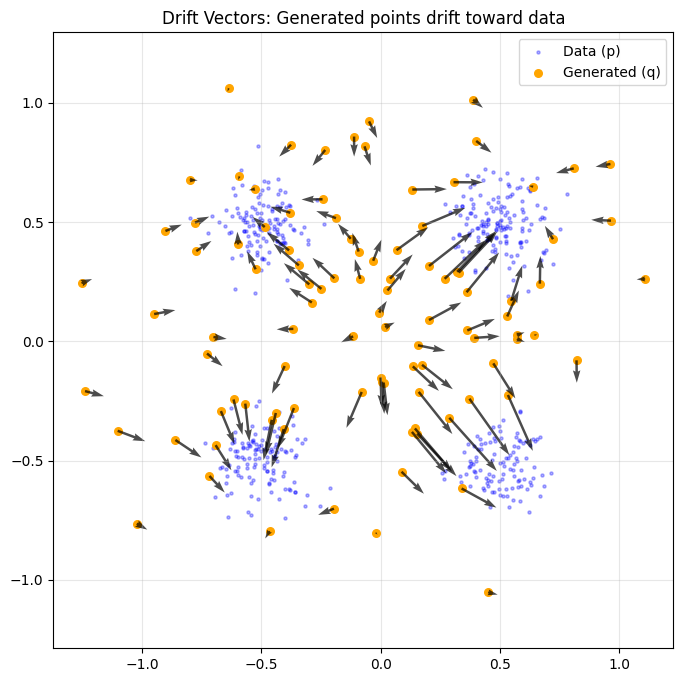

In [ ]:
# Quick visualization of drift vectors
torch.manual_seed(42)

# Random generated points (from Gaussian)
gen_test = torch.randn(100, 2) * 0.5

# Target data: simple 4-mode Gaussian mixture
centers = torch.tensor([[-0.5, -0.5], [-0.5, 0.5], [0.5, -0.5], [0.5, 0.5]])
idx = torch.randint(0, 4, (500,))
pos_test = centers[idx] + torch.randn(500, 2) * 0.1

# Compute drift
drift_test = compute_drift(gen_test, pos_test, temp=0.2)

# Plot
plt.figure(figsize=(8, 8))
plt.scatter(pos_test[:, 0], pos_test[:, 1], s=5, alpha=0.3, c='blue', label='Data (p)')
plt.scatter(gen_test[:, 0], gen_test[:, 1], s=30, c='orange', label='Generated (q)')
plt.quiver(gen_test[:, 0], gen_test[:, 1], drift_test[:, 0], drift_test[:, 1],
           scale=3, color='black', alpha=0.7, width=0.004)
plt.legend()
plt.title('Drift Vectors: Generated points drift toward data')
plt.axis('equal')
plt.grid(True, alpha=0.3)
plt.show()

---

# Part 2: Toy 2D Examples

Let's train on 2D distributions to visualize the full training dynamics.

We'll use two classic test distributions:
- **Checkerboard**: 4 diagonally-arranged squares (tests mode coverage)
- **Swiss Roll**: Spiral pattern (tests learning complex geometry)

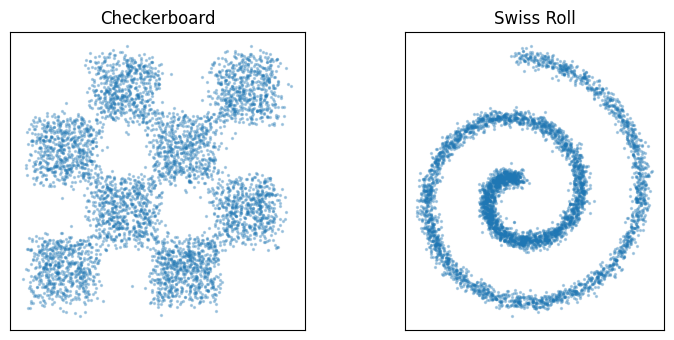

In [ ]:
# ============================================================
# Toy Dataset Samplers (minimal; copied from toy_mean_drift.py)
# ============================================================

def sample_checkerboard(n: int, noise: float = 0.05, seed: int | None = None) -> torch.Tensor:
    g = torch.Generator().manual_seed(seed) if seed is not None else None
    b = torch.randint(0, 2, (n,), generator=g)
    i = torch.randint(0, 2, (n,), generator=g) * 2 + b
    j = torch.randint(0, 2, (n,), generator=g) * 2 + b
    u = torch.rand(n, generator=g)
    v = torch.rand(n, generator=g)
    pts = torch.stack([i + u, j + v], dim=1) - 2.0
    pts = pts / 2.0
    if noise > 0:
        pts = pts + noise * torch.randn(pts.shape, generator=g)
    return pts


def sample_swiss_roll(n: int, noise: float = 0.03, seed: int | None = None) -> torch.Tensor:
    g = torch.Generator().manual_seed(seed) if seed is not None else None
    u = torch.rand(n, generator=g)
    t = 0.5 * math.pi + 4.0 * math.pi * u
    pts = torch.stack([t * torch.cos(t), t * torch.sin(t)], dim=1)
    pts = pts / (pts.abs().max() + 1e-8)
    if noise > 0:
        pts = pts + noise * torch.randn(pts.shape, generator=g)
    return pts


# quick look
fig, axes = plt.subplots(1, 2, figsize=(8, 3.5))
for ax, (name, sampler) in zip(axes, [("Checkerboard", sample_checkerboard), ("Swiss Roll", sample_swiss_roll)]):
    pts = sampler(5000).numpy()
    ax.scatter(pts[:, 0], pts[:, 1], s=2, alpha=0.3)
    ax.set_aspect("equal")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(name)
plt.tight_layout()
plt.show()

In [ ]:
# ============================================================
# Training Loop for Toy 2D
# ============================================================
from functools import partial
class MLP(nn.Module):
    """MLP: noise -> output. 3 hidden layers with SiLU."""
    def __init__(self, in_dim=32, hidden=256, out_dim=2):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(in_dim, hidden), nn.SiLU(),
            nn.Linear(hidden, hidden), nn.SiLU(),
            nn.Linear(hidden, hidden), nn.SiLU(),
            nn.Linear(hidden, out_dim),
        )
    def forward(self, z):
        return self.net(z)

def train_toy(sampler, steps=2000, data_batch_size=2048, gen_batch_size=2048, lr=1e-3, temp=0.05,
              in_dim=32, hidden=256, plot_every=500, seed=42):
    """Train drifting model. Returns model and loss history."""
    torch.manual_seed(seed)
    model = MLP(in_dim=in_dim, hidden=hidden, out_dim=2).to(DEVICE)
    opt = torch.optim.Adam(model.parameters(), lr=lr)

    loss_history = []
    ema = None
    pbar = tqdm(range(1, steps + 1))
    for step in pbar:
        pos = sampler(data_batch_size).to(DEVICE)
        gen = model(torch.randn(gen_batch_size, in_dim, device=DEVICE))
        loss = drifting_loss(gen, pos, compute_drift=partial(compute_drift, temp=temp))

        opt.zero_grad()
        loss.backward()
        opt.step()

        loss_history.append(loss.item())
        ema = loss.item() if ema is None else 0.96 * ema + 0.04 * loss.item()
        pbar.set_postfix(loss=f"{ema:.2e}")

        if step % plot_every == 0 or step == 1:
            with torch.no_grad():
                vis = model(torch.randn(5000, in_dim, device=DEVICE)).cpu().numpy()
                gt = sampler(5000).numpy()
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 3.5))
            ax1.scatter(gt[:, 0], gt[:, 1], s=2, alpha=0.3, c='black')
            ax1.set_title('Target'); ax1.set_aspect('equal'); ax1.axis('off')
            ax2.scatter(vis[:, 0], vis[:, 1], s=2, alpha=0.3, c='tab:orange')
            ax2.set_title(f'Generated (step {step})'); ax2.set_aspect('equal'); ax2.axis('off')
            plt.tight_layout(); plt.show()

    return model, loss_history

Training on Swiss Roll...


  0%|          | 0/2000 [00:00<?, ?it/s]

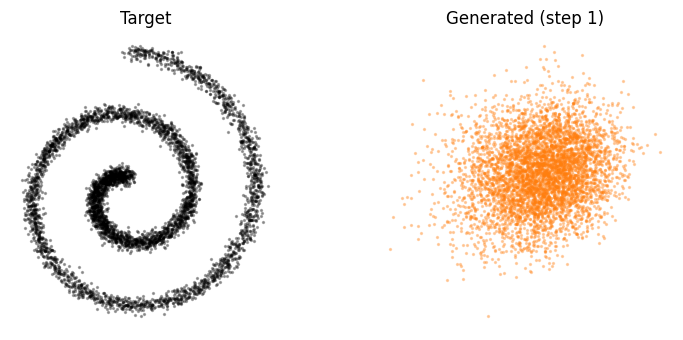

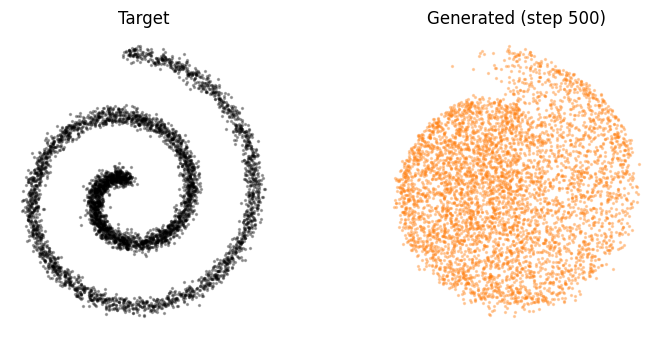

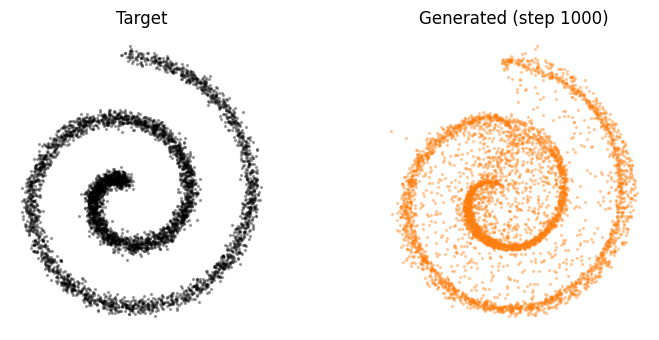

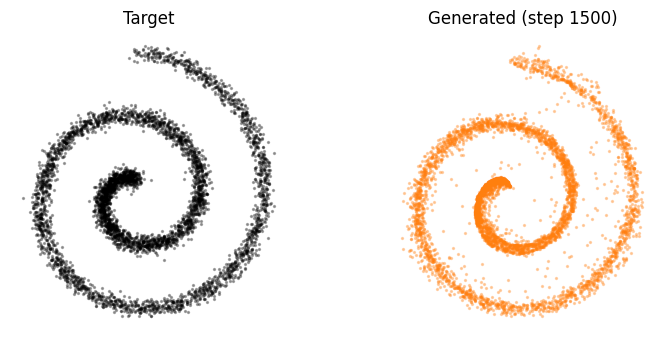

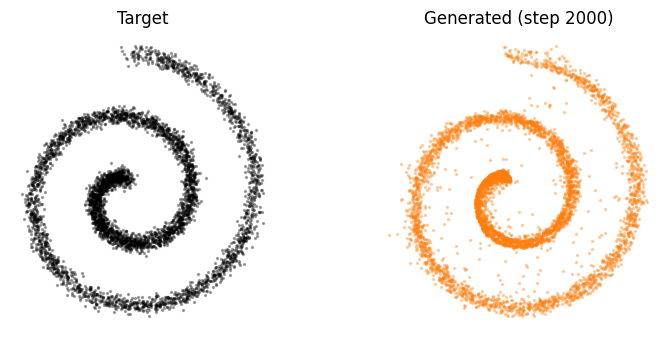

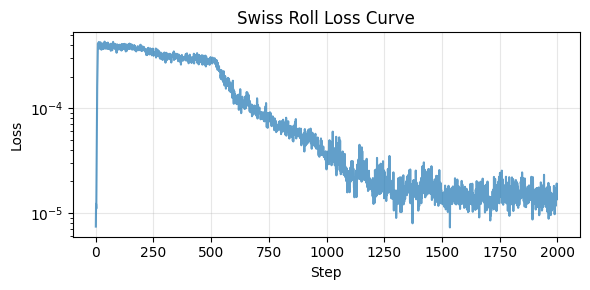

In [ ]:
# Train on Swiss Roll
print("Training on Swiss Roll...")
model_swiss, loss_swiss = train_toy(sample_swiss_roll, steps=2000, lr=1e-3, temp=0.05)

plt.figure(figsize=(6, 3))
plt.plot(loss_swiss, alpha=0.7)
plt.xlabel('Step'); plt.ylabel('Loss'); plt.title('Swiss Roll Loss Curve')
plt.yscale('log'); plt.grid(True, alpha=0.3); plt.tight_layout(); plt.show()



Training on Checkerboard...


  0%|          | 0/2000 [00:00<?, ?it/s]

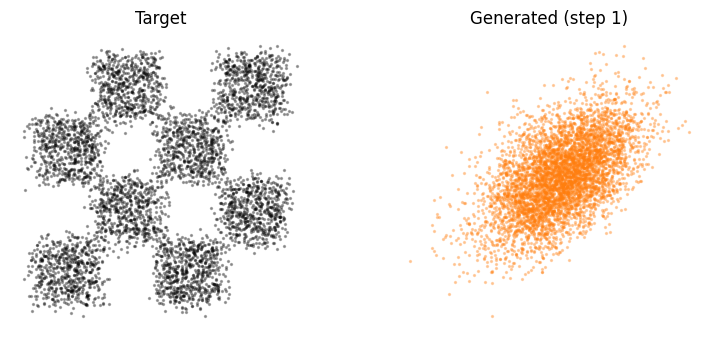

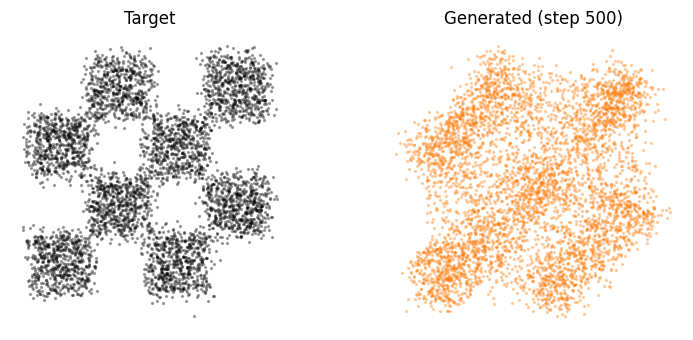

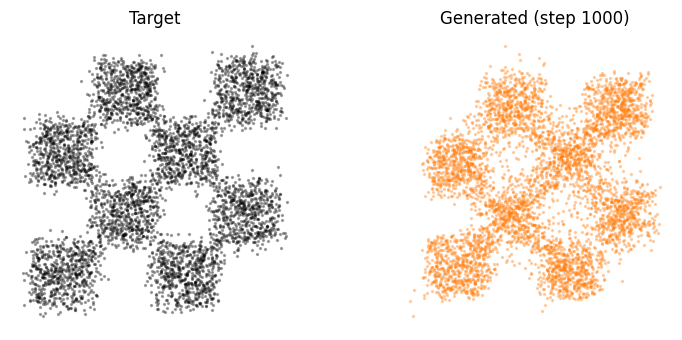

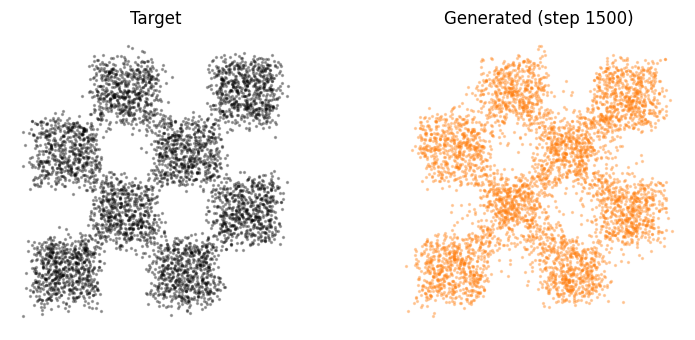

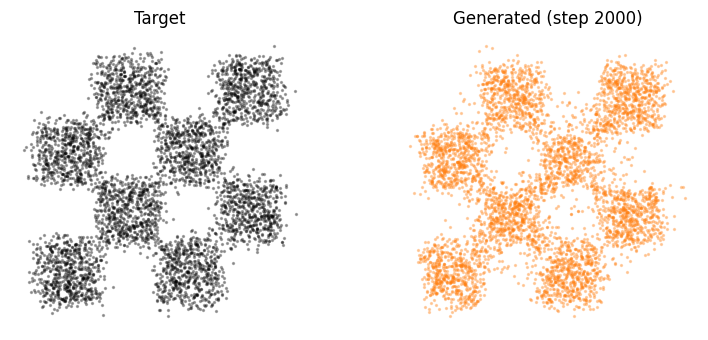

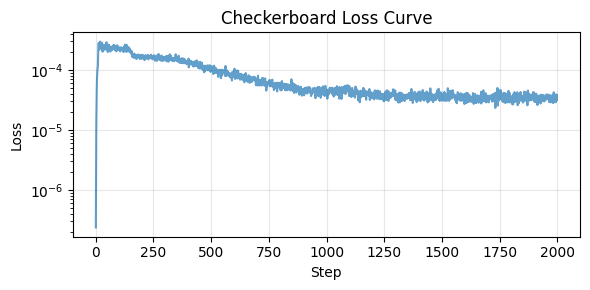

In [ ]:

# Train on Checkerboard
print("\nTraining on Checkerboard...")
model_checker, loss_checker = train_toy(sample_checkerboard, steps=2000, lr=1e-3, temp=0.05)

plt.figure(figsize=(6, 3))
plt.plot(loss_checker, alpha=0.7)
plt.xlabel('Step'); plt.ylabel('Loss'); plt.title('Checkerboard Loss Curve')
plt.yscale('log'); plt.grid(True, alpha=0.3); plt.tight_layout(); plt.show()

## Training on an image

Training RGB Point Cloud...


  0%|          | 0/5000 [00:00<?, ?it/s]

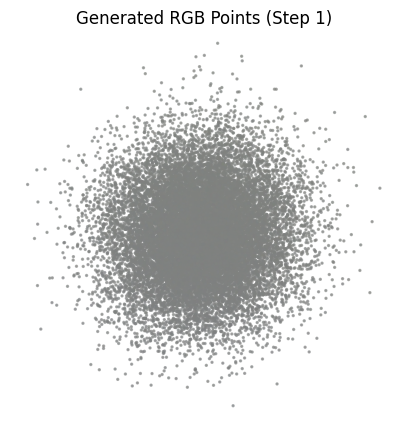

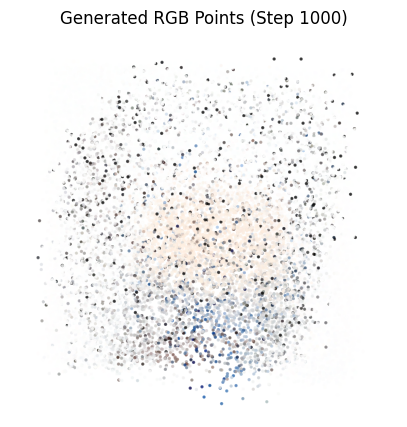

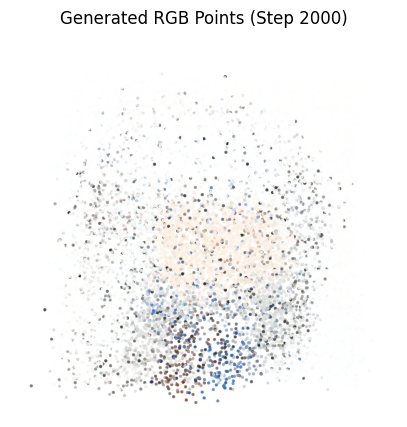

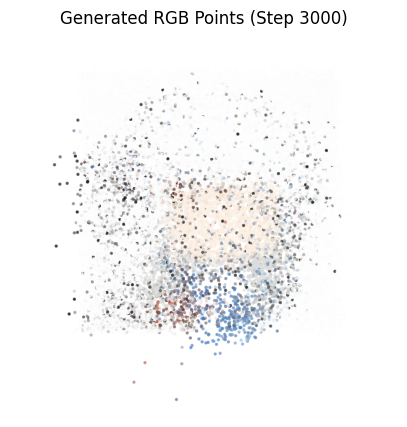

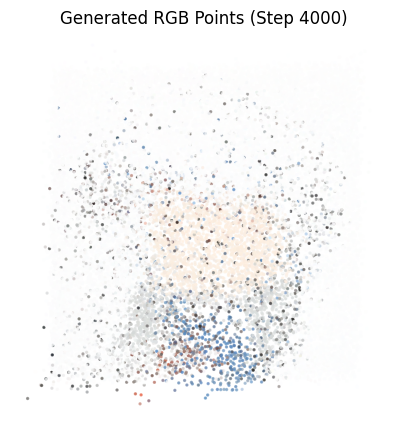

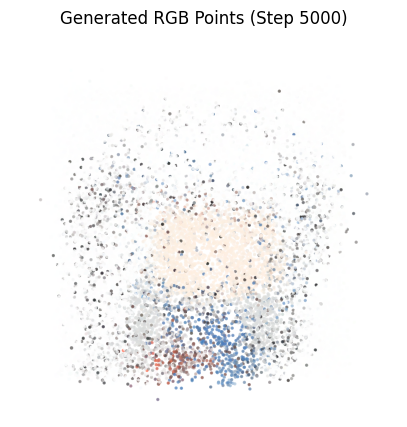

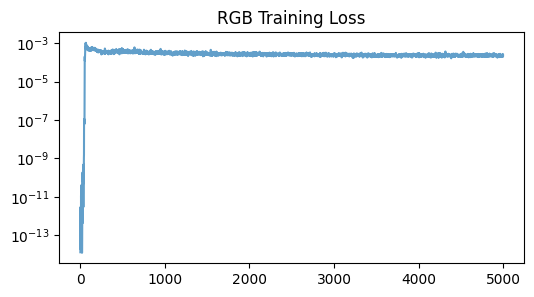

In [ ]:
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import numpy as np
from skimage import data, transform, color
from tqdm.auto import tqdm
from functools import partial

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# ============================================================
# 1. RGB Sampler (Returns N x 5 tensor)
# ============================================================
def get_rgb_sampler(size=128): # Increased resolution for better color
    """
    Returns a function that samples (x, y, r, g, b).
    Output range: [-2, 2] for all dimensions.
    """
    # Load Image (Astronaut)
    # img = data.astronaut()
    # img = transform.resize(img, (size, size)) # Shape: (Size, Size, 3), range [0, 1]
    import matplotlib.pyplot as plt
    img = plt.imread('/content/gura.png')
    img = transform.resize(img, (size, size)) # Shape: (Size, Size, 3), range [0, 1]
    # Create Probability Distribution from Luminance (Grayscale)
    # We use this to decide WHERE to put points.
    img_gray = color.rgb2gray(img)
    pdf = img_gray / img_gray.sum()
    pdf_flat = torch.from_numpy(pdf.flatten()).float().to(DEVICE)

    # Flatten RGB for easy lookup
    # (H*W, 3)
    img_flat = torch.from_numpy(img.reshape(-1, 3)).float().to(DEVICE)

    def sampler(n: int) -> torch.Tensor:
        # 1. Sample Indices based on brightness
        indices = torch.multinomial(pdf_flat, n, replacement=True)

        # 2. Get Coordinates (x, y)
        y = torch.div(indices, size, rounding_mode='floor')
        x = indices % size

        # 3. Get Colors (r, g, b) at those indices
        rgb = img_flat[indices] # Shape (N, 3)

        # 4. Construct the 5D vector
        # Position: Flip y to match cartesian
        xy = torch.stack([x, size - 1 - y], dim=1).float()

        # De-quantize position (add noise to fill pixel gaps)
        xy += torch.rand_like(xy)

        # 5. NORMALIZE EVERYTHING TO [-2, 2]
        # Positions: [0, size] -> [-2, 2]
        xy = (xy / size) * 4.0 - 2.0

        # Colors: [0, 1] -> [-2, 2]
        # This ensures the loss function treats Color errors as seriously as Position errors
        rgb = rgb * 4.0 - 2.0

        # Concatenate: (N, 5)
        return torch.cat([xy, rgb], dim=1)

    return sampler

sample_rgb_fn = get_rgb_sampler(size=128)

# ============================================================
# 2. MLP (Output dim = 5)
# ============================================================
class MLP(nn.Module):
    def __init__(self, in_dim=32, hidden=512, out_dim=5):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(in_dim, hidden), nn.SiLU(),
            nn.Linear(hidden, hidden), nn.SiLU(),
            nn.Linear(hidden, hidden), nn.SiLU(),
            nn.Linear(hidden, out_dim), # Output: x, y, r, g, b
        )
    def forward(self, z):
        return self.net(z)

# ============================================================
# 3. Training Loop
# ============================================================
def train_rgb(sampler, steps=5000, batch_size=4096, lr=1e-3, temp=0.05,
              in_dim=32, hidden=512, plot_every=1000):

    # out_dim=5 to capture (x, y, r, g, b)
    model = MLP(in_dim=in_dim, hidden=hidden, out_dim=5).to(DEVICE)
    opt = torch.optim.Adam(model.parameters(), lr=lr)

    loss_history = []
    ema = None
    pbar = tqdm(range(1, steps + 1))

    for step in pbar:
        # Sample Real Data (Batch of 5D vectors)
        target = sampler(batch_size).to(DEVICE)

        # Generate Data
        noise = torch.randn(batch_size, in_dim, device=DEVICE)
        generated = model(noise)

        # Calculate Loss (Sinkhorn/OT) on 5D space
        # It tries to match positions AND colors simultaneously
        loss = drifting_loss(generated, target, compute_drift=partial(compute_drift, temp=temp))

        opt.zero_grad()
        loss.backward()
        opt.step()

        loss_history.append(loss.item())
        ema = loss.item() if ema is None else 0.96 * ema + 0.04 * loss.item()
        pbar.set_postfix(loss=f"{ema:.2e}")

        # Visualization
        if step % plot_every == 0 or step == 1:
            with torch.no_grad():
                # Generate many points for dense visualization
                # We need more points to make the colors look solid
                vis_data = model(torch.randn(20000, in_dim, device=DEVICE)).cpu().numpy()

            # Unpack dimensions
            x, y = vis_data[:, 0], vis_data[:, 1]
            rgb = vis_data[:, 2:]

            # Un-normalize colors from [-2, 2] back to [0, 1] for matplotlib
            rgb = (rgb + 2.0) / 4.0
            rgb = np.clip(rgb, 0, 1) # Clip to ensure valid color range

            plt.figure(figsize=(5, 5))
            # Scatter plot with 'c' argument taking the RGB array
            plt.scatter(x, y, s=2, alpha=0.6, c=rgb)

            plt.title(f'Generated RGB Points (Step {step})')
            plt.xlim(-2.5, 2.5); plt.ylim(-2.5, 2.5)
            plt.axis('equal'); plt.axis('off')
            plt.show()

    return model, loss_history

# ============================================================
# Run
# ============================================================
print("Training RGB Point Cloud...")
model_rgb, loss_rgb = train_rgb(sample_rgb_fn, steps=5000, lr=1e-3, temp=0.05)

plt.figure(figsize=(6, 3))
plt.plot(loss_rgb, alpha=0.7)
plt.title('RGB Training Loss')
plt.yscale('log'); plt.show()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
data.astronaut().shape

(512, 512, 3)

In [ ]:
import matplotlib.pyplot as plt
cat = plt.imread('/content/cat.png')

In [ ]:
cat.shape

(120, 118, 3)

Training RGB Point Cloud...


  0%|          | 0/5000 [00:00<?, ?it/s]

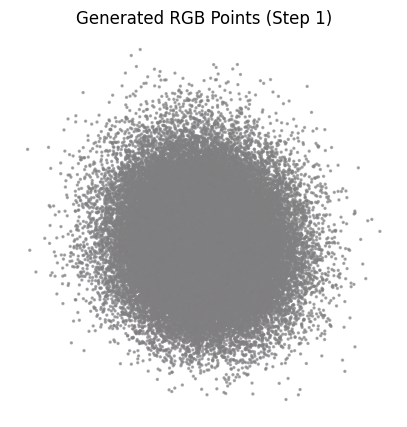

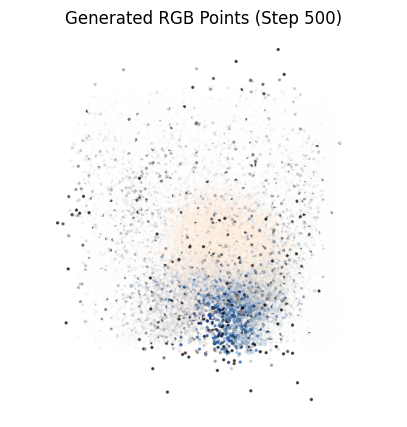

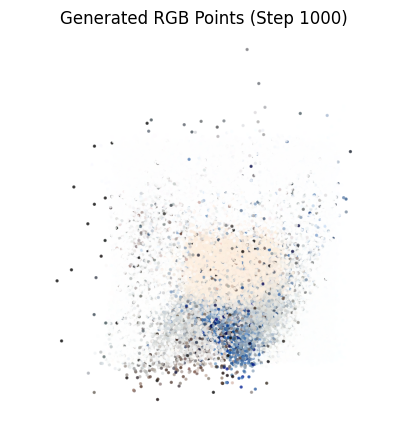

KeyboardInterrupt: 

In [ ]:
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import numpy as np
from skimage import data, transform, color
from tqdm.auto import tqdm
from functools import partial

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# ============================================================
# 1. RGB Sampler (Returns N x 5 tensor)
# ============================================================
def get_rgb_sampler(size=128): # Increased resolution for better color
    """
    Returns a function that samples (x, y, r, g, b).
    Output range: [-2, 2] for all dimensions.
    """
    # Load Image (Astronaut)
    # img = data.astronaut()
    # img = transform.resize(img, (size, size)) # Shape: (Size, Size, 3), range [0, 1]
    import matplotlib.pyplot as plt
    img = plt.imread('/content/gura.png')
    img = transform.resize(img, (size, size)) # Shape: (Size, Size, 3), range [0, 1]
    # Create Probability Distribution from Luminance (Grayscale)
    # We use this to decide WHERE to put points.
    img_gray = color.rgb2gray(img)
    pdf = img_gray / img_gray.sum()
    pdf_flat = torch.from_numpy(pdf.flatten()).float().to(DEVICE)

    # Flatten RGB for easy lookup
    # (H*W, 3)
    img_flat = torch.from_numpy(img.reshape(-1, 3)).float().to(DEVICE)

    def sampler(n: int) -> torch.Tensor:
        # 1. Sample Indices based on brightness
        indices = torch.multinomial(pdf_flat, n, replacement=True)

        # 2. Get Coordinates (x, y)
        y = torch.div(indices, size, rounding_mode='floor')
        x = indices % size

        # 3. Get Colors (r, g, b) at those indices
        rgb = img_flat[indices] # Shape (N, 3)

        # 4. Construct the 5D vector
        # Position: Flip y to match cartesian
        xy = torch.stack([x, size - 1 - y], dim=1).float()

        # De-quantize position (add noise to fill pixel gaps)
        # xy += torch.rand_like(xy)

        # 5. NORMALIZE EVERYTHING TO [-2, 2]
        # Positions: [0, size] -> [-2, 2]
        xy = (xy / size) * 4.0 - 2.0

        # Colors: [0, 1] -> [-2, 2]
        # This ensures the loss function treats Color errors as seriously as Position errors
        rgb = rgb * 4.0 - 2.0

        # Concatenate: (N, 5)
        return torch.cat([xy, rgb], dim=1)

    return sampler

sample_rgb_fn = get_rgb_sampler(size=256)

# ============================================================
# 2. MLP (Output dim = 5)
# ============================================================
class MLP(nn.Module):
    def __init__(self, in_dim=64, hidden=1024, out_dim=5):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(in_dim, hidden), nn.SiLU(),
            nn.Linear(hidden, hidden), nn.SiLU(),
            nn.Linear(hidden, hidden), nn.SiLU(),
            nn.Linear(hidden, out_dim), # Output: x, y, r, g, b
        )
    def forward(self, z):
        return self.net(z)

# ============================================================
# 3. Training Loop
# ============================================================
def train_rgb(sampler, steps=5000, batch_size=8192, lr=1e-3, temp=0.05,
              in_dim=64, hidden=1024, plot_every=500):

    # out_dim=5 to capture (x, y, r, g, b)
    model = MLP(in_dim=in_dim, hidden=hidden, out_dim=5).to(DEVICE)
    opt = torch.optim.Adam(model.parameters(), lr=lr)

    loss_history = []
    ema = None
    pbar = tqdm(range(1, steps + 1))

    for step in pbar:
        # Sample Real Data (Batch of 5D vectors)
        target = sampler(batch_size).to(DEVICE)

        # Generate Data
        noise = torch.randn(batch_size, in_dim, device=DEVICE)
        generated = model(noise)

        # Calculate Loss (Sinkhorn/OT) on 5D space
        # It tries to match positions AND colors simultaneously
        loss = drifting_loss(generated, target, compute_drift=partial(compute_drift, temp=temp))

        opt.zero_grad()
        loss.backward()
        opt.step()

        loss_history.append(loss.item())
        ema = loss.item() if ema is None else 0.96 * ema + 0.04 * loss.item()
        pbar.set_postfix(loss=f"{ema:.2e}")

        # Visualization
        if step % plot_every == 0 or step == 1:
            with torch.no_grad():
                # Generate many points for dense visualization
                # We need more points to make the colors look solid
                vis_data = model(torch.randn(256*256, in_dim, device=DEVICE)).cpu().numpy()

            # Unpack dimensions
            x, y = vis_data[:, 0], vis_data[:, 1]
            rgb = vis_data[:, 2:]

            # Un-normalize colors from [-2, 2] back to [0, 1] for matplotlib
            rgb = (rgb + 2.0) / 4.0
            rgb = np.clip(rgb, 0, 1) # Clip to ensure valid color range

            plt.figure(figsize=(5, 5))
            # Scatter plot with 'c' argument taking the RGB array
            plt.scatter(x, y, s=2, alpha=0.6, c=rgb)

            plt.title(f'Generated RGB Points (Step {step})')
            plt.xlim(-2.5, 2.5); plt.ylim(-2.5, 2.5)
            plt.axis('equal'); plt.axis('off')
            plt.show()

    return model, loss_history

# ============================================================
# Run
# ============================================================
print("Training RGB Point Cloud...")
model_rgb, loss_rgb = train_rgb(sample_rgb_fn, steps=5000, lr=1e-3, temp=0.05)

plt.figure(figsize=(6, 3))
plt.plot(loss_rgb, alpha=0.7)
plt.title('RGB Training Loss')
plt.yscale('log'); plt.show()

In [ ]:
    import matplotlib.pyplot as plt
    img = plt.imread('/content/gura.png')
    # img = transform.resize(img, (size, size)) # Shape: (Size, Size, 3), range [0, 1]
    img.shape

(384, 384, 3)

Dataset shape: torch.Size([65536, 5])
Training on True Image Data...


  0%|          | 0/50000 [00:00<?, ?it/s]

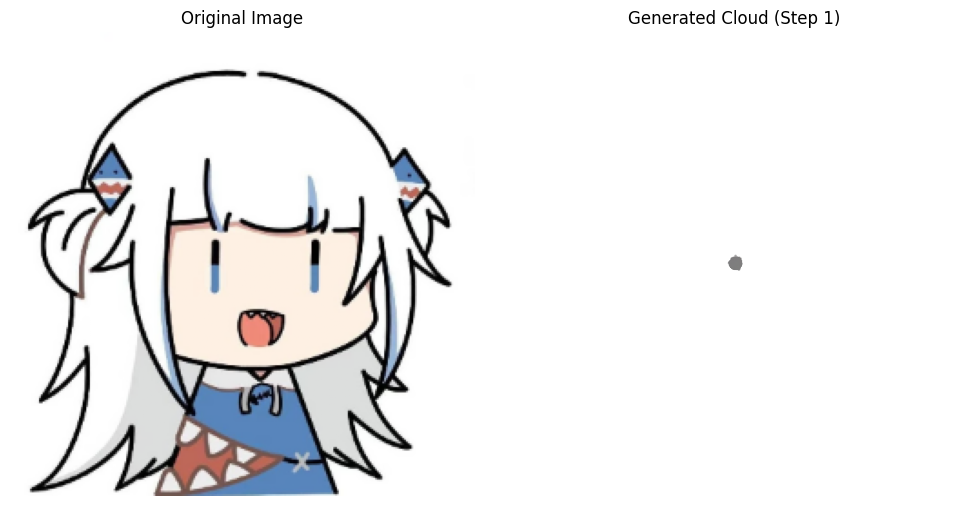

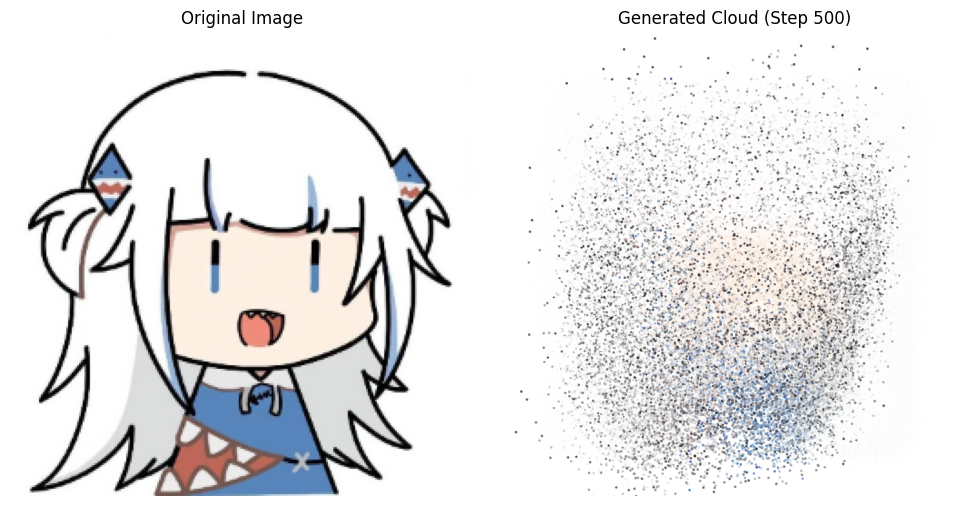

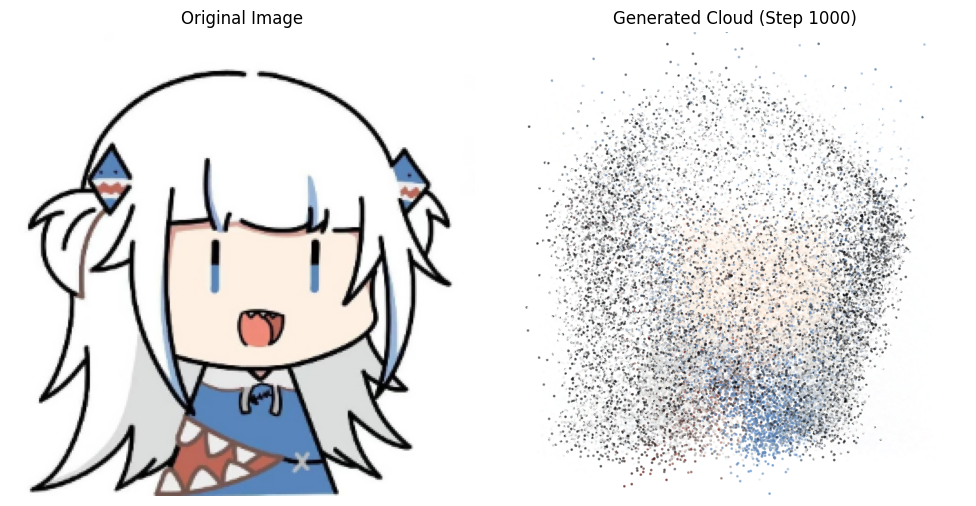

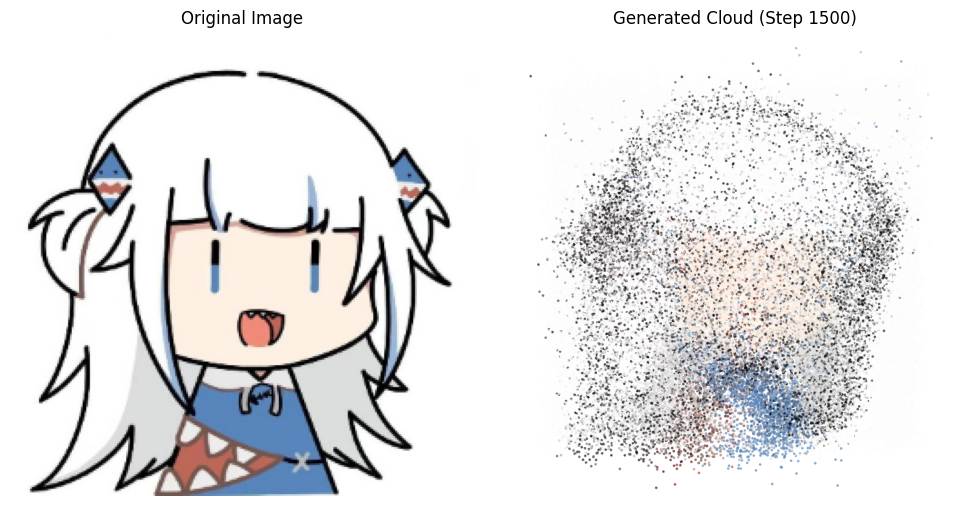

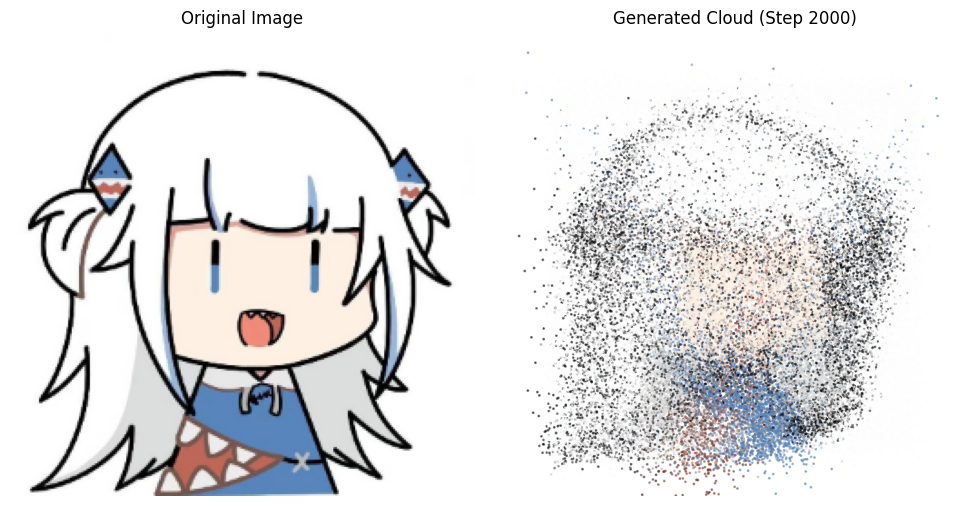

...

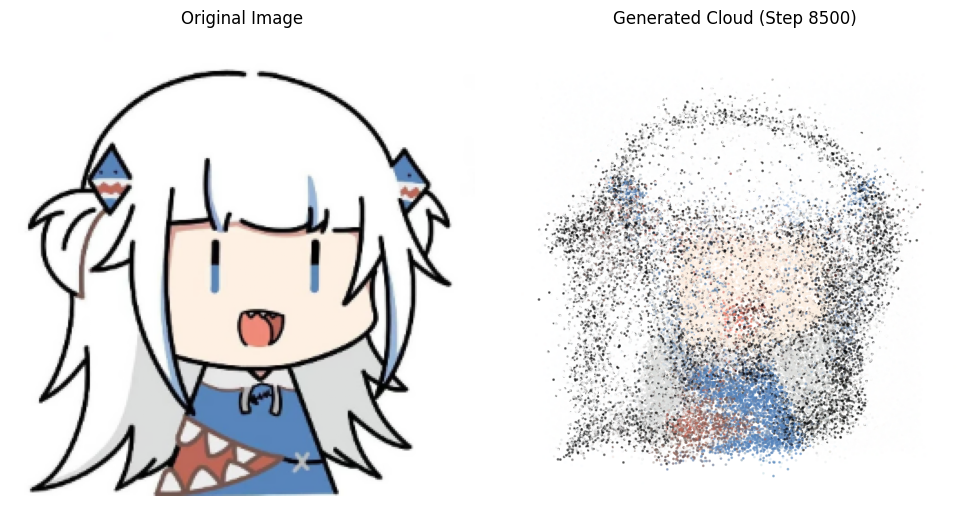

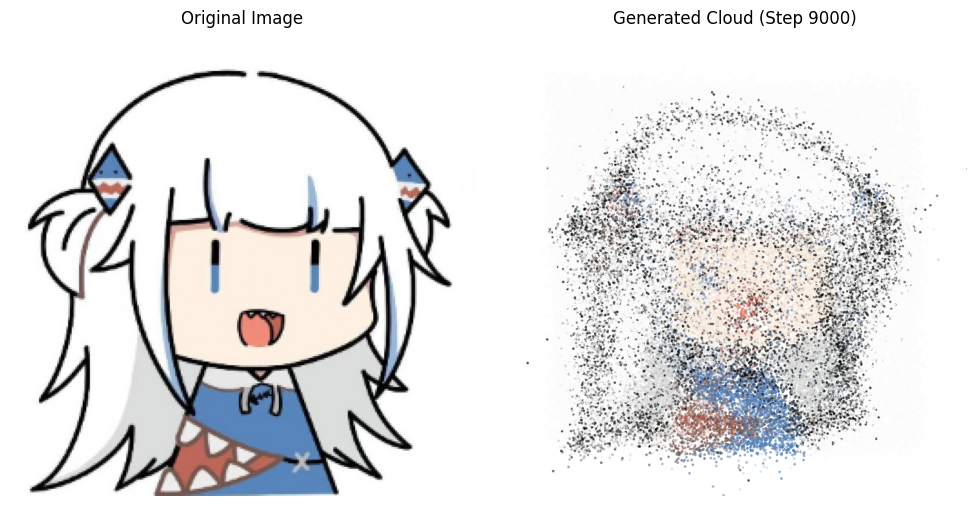

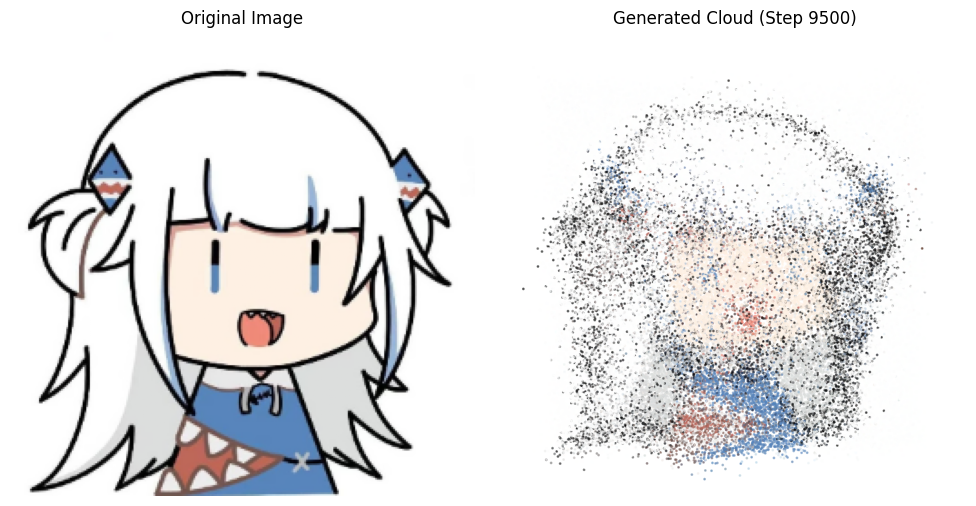

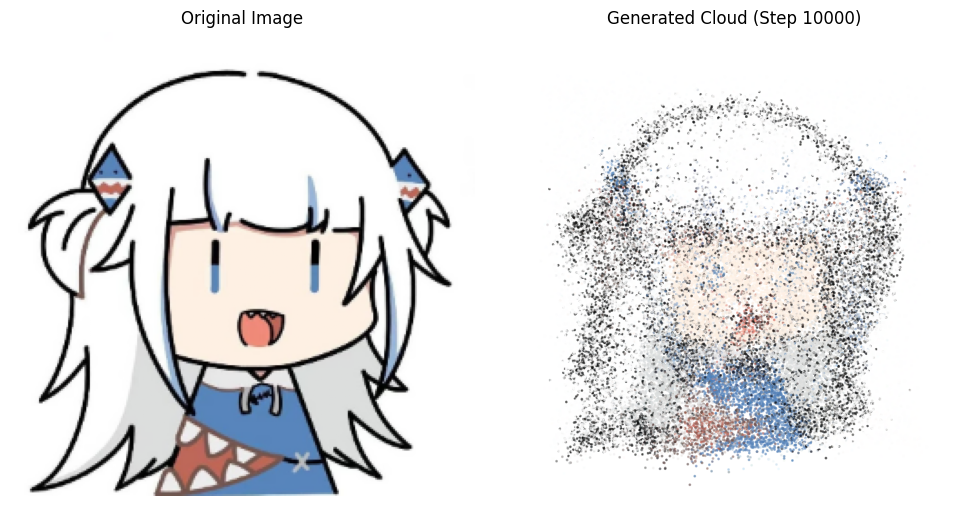

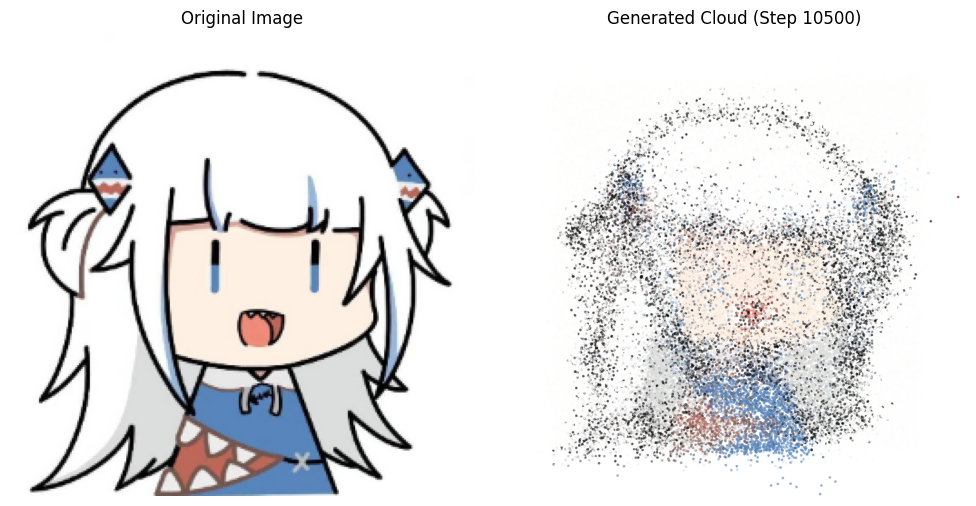

In [ ]:
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import numpy as np
from skimage import data, transform
import os
from tqdm.auto import tqdm
from functools import partial

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# ============================================================
# 1. Data Preparation: Image -> Fixed Tensor
# ============================================================
def get_image_tensor(path='/content/gura.png', size=128):
    """
    Loads an image and converts it into a fixed tensor of (N, 5) values.
    Returns:
        dataset: Tensor of shape (H*W, 5) -> (x, y, r, g, b)
        img_display: Numpy array of the image for visualization
    """
    # 1. Load Image
    if os.path.exists(path):
        img = plt.imread(path)
    else:
        print(f"Warning: '{path}' not found. Using sample astronaut image.")
        img = data.astronaut()

    # 2. Resize
    img = transform.resize(img, (size, size))  # Returns floats [0, 1]

    # Handle Alpha Channel (if PNG has transparency, remove transparent pixels)
    if img.shape[2] == 4:
        # Filter pixels where Alpha > 0.1
        mask = img[:, :, 3] > 0.1
        img_rgb = img[:, :, :3]

        # Create coordinate grids
        yy, xx = np.mgrid[:size, :size]

        # Select valid pixels
        x_flat = xx[mask]
        y_flat = yy[mask]
        rgb_flat = img_rgb[mask]
    else:
        # Standard RGB: Use all pixels
        img_rgb = img[:, :, :3]
        yy, xx = np.mgrid[:size, :size]
        x_flat = xx.flatten()
        y_flat = yy.flatten()
        rgb_flat = img_rgb.reshape(-1, 3)

    # 3. Normalize Coordinates & Colors to [-2, 2]
    # We want the neural network to operate in a standard range centered on 0

    # Normalize X, Y
    # [0, size] -> [0, 1] -> [0, 4] -> [-2, 2]
    x_norm = (x_flat / size) * 4.0 - 2.0
    y_norm = ((size - 1 - y_flat) / size) * 4.0 - 2.0 # Flip Y for Cartesian

    # Normalize RGB
    # [0, 1] -> [-2, 2]
    rgb_norm = rgb_flat * 4.0 - 2.0

    # 4. Stack into single tensor (N, 5)
    data_np = np.column_stack([x_norm, y_norm, rgb_norm])
    dataset = torch.from_numpy(data_np).float().to(DEVICE)

    return dataset, img

# Load the fixed dataset ONCE
# Note: Increase size to 256 or 512 for higher detail if your GPU allows
dataset_tensor, original_img = get_image_tensor(path='/content/gura.png', size=256)
print(f"Dataset shape: {dataset_tensor.shape}")

# ============================================================
# 2. MLP Model
# ============================================================
class MLP(nn.Module):
    def __init__(self, in_dim=64, hidden=1024, out_dim=5):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(in_dim, hidden), nn.SiLU(),
            nn.Linear(hidden, hidden), nn.SiLU(),
            nn.Linear(hidden, hidden), nn.SiLU(),
            nn.Linear(hidden, out_dim), # Output: x, y, r, g, b
        )
    def forward(self, z):
        return self.net(z)

# ============================================================
# 3. Training Loop
# ============================================================
def train_rgb_static(dataset, img_display, steps=50000, batch_size=8192, lr=1e-3, temp=0.025,
                     in_dim=64, hidden=1024, plot_every=500):

    model = MLP(in_dim=in_dim, hidden=hidden, out_dim=5).to(DEVICE)
    opt = torch.optim.Adam(model.parameters(), lr=lr)

    loss_history = []
    ema = None
    num_samples = dataset.shape[0]
    pbar = tqdm(range(1, steps + 1))

    for step in pbar:
        # 1. Sample a random batch from the FIXED dataset
        # This is equivalent to "sampling from the true image"
        idx = torch.randint(0, num_samples, (batch_size,), device=DEVICE)
        target = dataset[idx]

        # 2. Generate Data
        noise = torch.randn(batch_size, in_dim, device=DEVICE)
        generated = model(noise)

        # 3. Calculate Loss
        loss = drifting_loss(generated, target, compute_drift=partial(compute_drift, temp=temp))

        opt.zero_grad()
        loss.backward()
        opt.step()

        loss_history.append(loss.item())
        ema = loss.item() if ema is None else 0.96 * ema + 0.04 * loss.item()
        pbar.set_postfix(loss=f"{ema:.2e}")

        # 4. Visualization
        if step % plot_every == 0 or step == 1:
            with torch.no_grad():
                # Visualize a large batch to see the quality
                vis_data = model(torch.randn(256*256, in_dim, device=DEVICE)).cpu().numpy()

            x, y = vis_data[:, 0], vis_data[:, 1]
            rgb = vis_data[:, 2:]

            # Un-normalize colors for display: [-2, 2] -> [0, 1]
            rgb = (rgb + 2.0) / 4.0
            rgb = np.clip(rgb, 0, 1)

            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

            # Show Original
            ax1.imshow(img_display)
            ax1.set_title("Original Image")
            ax1.axis('off')

            # Show Generated Point Cloud
            ax2.scatter(x, y, s=1, alpha=0.5, c=rgb)
            ax2.set_title(f'Generated Cloud (Step {step})')
            ax2.set_xlim(-2.5, 2.5); ax2.set_ylim(-2.5, 2.5)
            ax2.set_aspect('equal'); ax2.axis('off')

            plt.tight_layout()
            plt.show()

    return model, loss_history

# ============================================================
# Run
# ============================================================
print("Training on True Image Data...")
model_rgb, loss_rgb = train_rgb_static(dataset_tensor, original_img, steps=50000, lr=1e-3, temp=0.05)

plt.figure(figsize=(6, 3))
plt.plot(loss_rgb, alpha=0.7)
plt.title('Training Loss')
plt.yscale('log'); plt.show()

In [ ]:
import matplotlib.pyplot as plt
img = plt.imread('/content/gura.png')
vis_data = model_rgb(torch.randn(256*256, 64, device='cuda'))

In [ ]:
vis_data_1 = vis_data

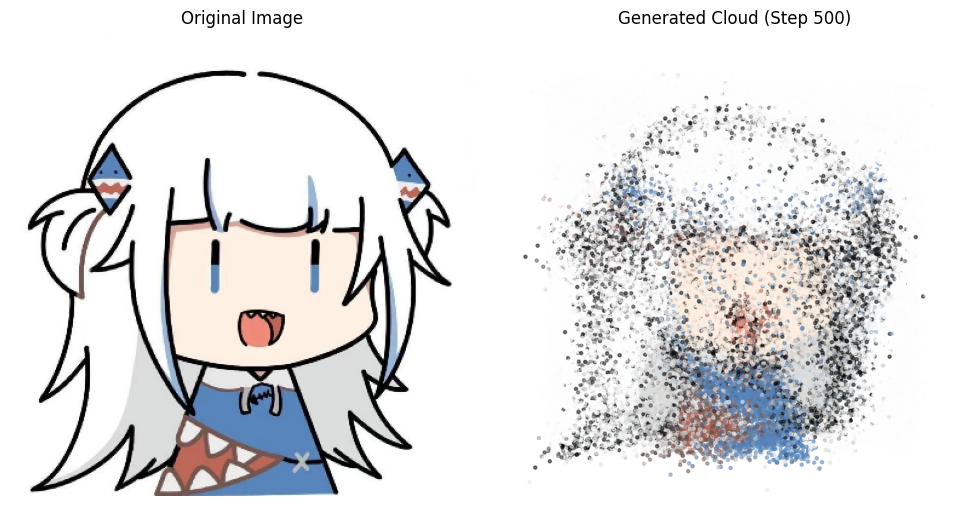

In [ ]:
# vis_data = vis_data.cpu().detach().numpy()
x, y = vis_data[:, 0], vis_data[:, 1]
rgb = vis_data[:, 2:]

# Un-normalize colors for display: [-2, 2] -> [0, 1]
rgb = (rgb + 2.0) / 4.0
rgb = np.clip(rgb, 0, 1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

# Show Original
ax1.imshow(img)
ax1.set_title("Original Image")
ax1.axis('off')

# Show Generated Point Cloud
ax2.scatter(x, y, s=5, alpha=0.5, c=rgb)
ax2.set_title(f'Generated Cloud (Step {500})')
ax2.set_xlim(-2.5, 2.5); ax2.set_ylim(-2.5, 2.5)
ax2.set_aspect('equal'); ax2.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import numpy as np
from skimage import data, transform
import os
from tqdm.auto import tqdm
from functools import partial
from transformers import ViTConfig, ViTModel

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# ============================================================
# 1. Data Preparation (Same as before)
# ============================================================
def get_image_tensor(path='/content/gura.png', size=128):
    if os.path.exists(path):
        img = plt.imread(path)
    else:
        print(f"Warning: '{path}' not found. Using sample astronaut image.")
        img = data.astronaut()

    img = transform.resize(img, (size, size))

    if img.shape[2] == 4:
        mask = img[:, :, 3] > 0.1
        img_rgb = img[:, :, :3]
        yy, xx = np.mgrid[:size, :size]
        x_flat = xx[mask]
        y_flat = yy[mask]
        rgb_flat = img_rgb[mask]
    else:
        img_rgb = img[:, :, :3]
        yy, xx = np.mgrid[:size, :size]
        x_flat = xx.flatten()
        y_flat = yy.flatten()
        rgb_flat = img_rgb.reshape(-1, 3)

    x_norm = (x_flat / size) * 4.0 - 2.0
    y_norm = ((size - 1 - y_flat) / size) * 4.0 - 2.0
    rgb_norm = rgb_flat * 4.0 - 2.0

    data_np = np.column_stack([x_norm, y_norm, rgb_norm])
    dataset = torch.from_numpy(data_np).float().to(DEVICE)

    return dataset, img

dataset_tensor, original_img = get_image_tensor(path='/content/gura.png', size=256)

# ============================================================
# 2. Hybrid ViT + MLP Model
# ============================================================
class HybridViTMLP(nn.Module):
    def __init__(self, in_dim=32, vit_hidden=256, mlp_hidden=256, out_dim=5):
        super().__init__()

        # A. Pre-Processing: Noise -> "Noise Image"
        # We project the 64-dim noise to a 3x32x32 pseudo-image (3072 pixels)
        self.img_size = 32
        self.noise_to_img = nn.Sequential(
            nn.Linear(in_dim, 3 * self.img_size * self.img_size),
            nn.LayerNorm(3 * self.img_size * self.img_size),
            nn.GELU()
        )

        # B. ViT Backbone
        # We configure a small ViT to run fast on the "noise images"
        config = ViTConfig(
            image_size=self.img_size, # 32x32
            patch_size=16,             # 4x4 patches
            num_channels=3,
            hidden_size=vit_hidden,   # Embedding dimension
            num_hidden_layers=4,      # Depth
            num_attention_heads=4,
            intermediate_size=vit_hidden * 4,
            hidden_act="gelu",
        )
        self.vit = ViTModel(config)

        # C. MLP Head
        # Takes the ViT output (CLS token) and maps to coordinates
        self.mlp = nn.Sequential(
            nn.Linear(vit_hidden, mlp_hidden), nn.SiLU(),
            nn.Linear(mlp_hidden, mlp_hidden), nn.SiLU(),
            nn.Linear(mlp_hidden, out_dim) # Output: x, y, r, g, b
        )

    def forward(self, z):
        # 1. Noise -> Pseudo-Image
        # z: (B, 64) -> (B, 3072) -> (B, 3, 32, 32)
        x = self.noise_to_img(z)
        x = x.view(-1, 3, self.img_size, self.img_size)

        # 2. ViT Forward Pass
        # Returns object with 'last_hidden_state' (B, SeqLen, Hidden)
        outputs = self.vit(pixel_values=x)

        # 3. Extract [CLS] Token Embedding
        # The first token (index 0) captures the global context of the "noise image"
        cls_embedding = outputs.last_hidden_state[:, 0, :]

        # 4. MLP Decoding
        out = self.mlp(cls_embedding)

        return out

# ============================================================
# 3. Training Loop
# ============================================================
def train_hybrid_model(dataset, img_display, steps=5000, batch_size=8192, lr=3e-4, temp=0.05,
                       in_dim=64, plot_every=500):

    # Initialize Hybrid Model
    model = HybridViTMLP(in_dim=in_dim).to(DEVICE)

    # AdamW is standard for Transformers
    opt = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=0.01)

    loss_history = []
    ema = None
    num_samples = dataset.shape[0]
    pbar = tqdm(range(1, steps + 1))

    for step in pbar:
        # 1. Sample Real Data
        idx = torch.randint(0, num_samples, (batch_size,), device=DEVICE)
        target = dataset[idx]

        # 2. Generate Data
        noise = torch.randn(batch_size, in_dim, device=DEVICE)
        generated = model(noise)

        # 3. Loss (Sinkhorn)
        loss = drifting_loss(generated, target, compute_drift=partial(compute_drift, temp=temp))

        opt.zero_grad()
        loss.backward()
        # Clip grads to stabilize the Transformer component
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        opt.step()

        loss_history.append(loss.item())
        ema = loss.item() if ema is None else 0.96 * ema + 0.04 * loss.item()
        pbar.set_postfix(loss=f"{ema:.2e}")

        # 4. Visualization
        if step % plot_every == 0 or step == 1:
            with torch.no_grad():
                vis_data = model(torch.randn(256*256, in_dim, device=DEVICE)).cpu().numpy()

            x, y = vis_data[:, 0], vis_data[:, 1]
            rgb = vis_data[:, 2:]

            rgb = (rgb + 2.0) / 4.0
            rgb = np.clip(rgb, 0, 1)

            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
            ax1.imshow(img_display); ax1.set_title("Original")
            ax1.axis('off')

            ax2.scatter(x, y, s=1, alpha=0.5, c=rgb)
            ax2.set_title(f'Hybrid ViT-MLP (Step {step})')
            ax2.set_xlim(-2.5, 2.5); ax2.set_ylim(-2.5, 2.5)
            ax2.set_aspect('equal'); ax2.axis('off')
            plt.tight_layout(); plt.show()

    return model, loss_history

# ============================================================
# Run
# ============================================================
print("Training Hybrid ViT-MLP...")
model_hybrid, loss_hybrid = train_hybrid_model(dataset_tensor, original_img, steps=5000, lr=3e-4, temp=0.05)

plt.figure(figsize=(6, 3))
plt.plot(loss_hybrid, alpha=0.7)
plt.title('Hybrid Training Loss')
plt.yscale('log'); plt.show()

Training Hybrid ViT-MLP...


  0%|          | 0/5000 [00:00<?, ?it/s]

OutOfMemoryError: CUDA out of memory. Tried to allocate 2.03 GiB. GPU 0 has a total capacity of 22.03 GiB of which 553.12 MiB is free. Including non-PyTorch memory, this process has 21.49 GiB memory in use. Of the allocated memory 21.19 GiB is allocated by PyTorch, and 78.76 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

In [ ]:
!nvidia-smi

Wed Feb 11 09:13:00 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA L4                      Off |   00000000:00:03.0 Off |                    0 |
| N/A   45C    P0             27W /   72W |   22178MiB /  23034MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----